# Government720 Interpolation
This notebook is for filling in the gaps between the missing data using interpolation. Each imputed dataset is then exported as a new dataset to be used for potential synthetic data for extrapolation.
Edit: extrapolation removed from this notebook.

### CLIENT 1: ECONOMY

In [1]:
# Import pandas
import pandas as pd

# Access Google Drive for Excel file
from google.colab import drive
drive.mount('/content/drive')

# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT1_ECONOMY', engine='openpyxl')

# Display the first few rows
print(df.head())

Mounted at /content/drive
              DATE  UNEMPLOYMENT_RATE  INFLATION_RATE   GDP  HOUSING_AFFORD  \
0  Week-1-Jan-2000                NaN             2.7  10.0             NaN   
1  Week-2-Jan-2000                NaN             NaN   NaN             NaN   
2  Week-3-Jan-2000                NaN             NaN   NaN             NaN   
3  Week-4-Jan-2000                NaN             NaN   NaN             NaN   
4  Week-1-Feb-2000                NaN             3.2   NaN             NaN   

   MIN_WAGE  POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  ...  PAYROLL_TAX  \
0      5.15           8.4        22.7        19.2      NaN  ...         3.93   
1       NaN           NaN         NaN         NaN      NaN  ...          NaN   
2       NaN           NaN         NaN         NaN      NaN  ...          NaN   
3       NaN           NaN         NaN         NaN      NaN  ...          NaN   
4       NaN           NaN         NaN         NaN      NaN  ...          NaN   

   CORPORATE_TAX  

In [2]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  UNEMPLOYMENT_RATE  INFLATION_RATE   GDP  HOUSING_AFFORD  \
0 2000-01-01                NaN             2.7  10.0             NaN   
1 2000-01-02                NaN             NaN   NaN             NaN   
2 2000-01-03                NaN             NaN   NaN             NaN   
3 2000-01-04                NaN             NaN   NaN             NaN   
4 2000-02-01                NaN             3.2   NaN             NaN   

   MIN_WAGE  POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  ...  PAYROLL_TAX  \
0      5.15           8.4        22.7        19.2      NaN  ...         3.93   
1       NaN           NaN         NaN         NaN      NaN  ...          NaN   
2       NaN           NaN         NaN         NaN      NaN  ...          NaN   
3       NaN           NaN         NaN         NaN      NaN  ...          NaN   
4       NaN           NaN         NaN         NaN      NaN  ...          NaN   

   CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0           1.24 

In [3]:
# Display data types of all columns in the DataFrame
print(df.dtypes)

# Convert 'CORPORATE_PROFIT' column from object to float64
df['CORPORATE_PROFIT'] = pd.to_numeric(df['CORPORATE_PROFIT'], errors='coerce')

# Verify the change
print(df['CORPORATE_PROFIT'].dtype)

DATE                     datetime64[ns]
UNEMPLOYMENT_RATE               float64
INFLATION_RATE                  float64
GDP                             float64
HOUSING_AFFORD                  float64
MIN_WAGE                        float64
POVERTY_WAGE                    float64
GENDER_GAP                      float64
RACIAL_GAP                      float64
DEFICIT                         float64
SS_RECIPIENTS                   float64
CPI                             float64
MEDIAN_WAGE                     float64
MANU_JOBS                       float64
UNION_MEMBERS                   float64
JOBS_ADDED                      float64
POVERTY_RATE                    float64
FED_EMPLOY                      float64
GAO_HIGH_RISK                   float64
INCOME_TAX                      float64
PAYROLL_TAX                     float64
CORPORATE_TAX                   float64
CORPORATE_PROFIT                 object
TOP1_WEALTH                     float64
FICO_SCORE                      float64


In [4]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   UNEMPLOYMENT_RATE  INFLATION_RATE        GDP  HOUSING_AFFORD  MIN_WAGE  \
0                NaN        2.700000  10.000000             NaN      5.15   
1                NaN        2.817597  10.009615             NaN      5.15   
2                NaN        2.942758  10.019231             NaN      5.15   
3                NaN        3.071540  10.028846             NaN      5.15   
4                NaN        3.200000  10.038462             NaN      5.15   

   POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  SS_RECIPIENTS  ...  \
0      8.400000   22.700000   19.200000      NaN   4.541470e+07  ...   
1      8.405275   22.702733   19.243111      NaN   4.542261e+07  ...   
2      8.410523   22.705164   19.285909      NaN   4.543054e+07  ...   
3      8.415744   22.707295   19.328403      NaN   4.543848e+07  ...   
4      8.420937   22.709130   19.370601      NaN   4.544644e+07  ...   

   PAYROLL_TAX  CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0     3.930000       1.24000

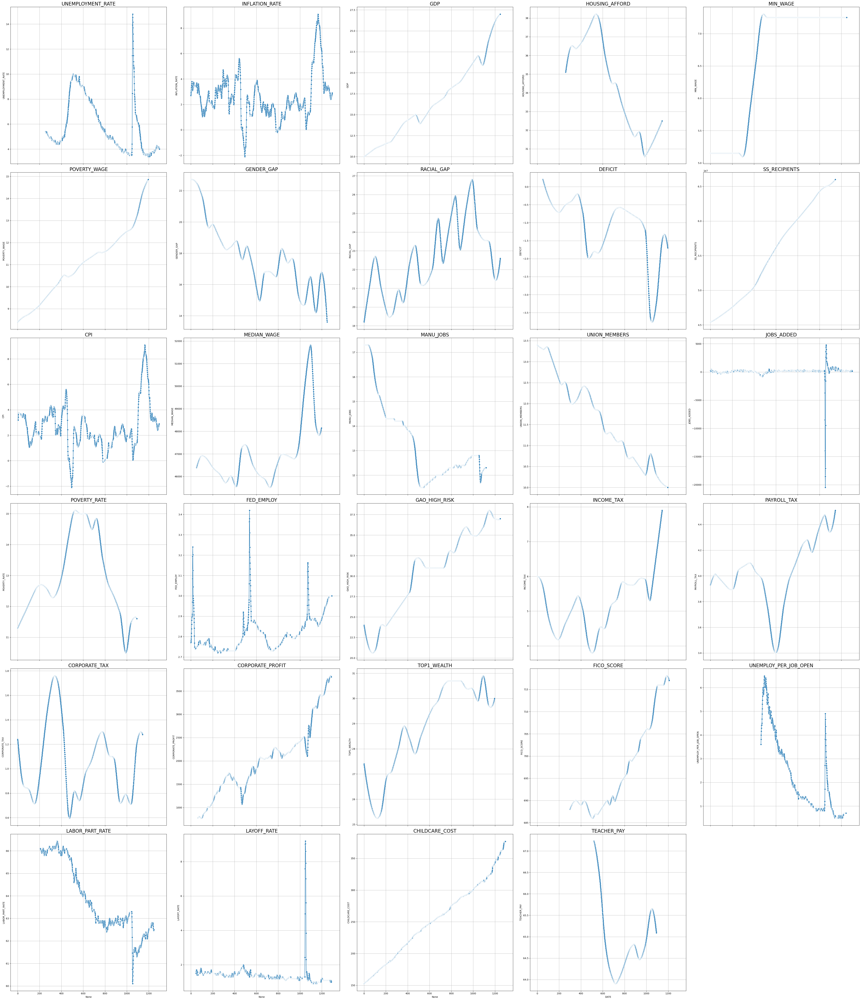

In [5]:
# Make multi-graph chart of numeric time series variables to verify interpolation method is good
# Import packages
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [6]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT1_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT1_Interpolated.xlsx


### CLIENT 2: MEDIA

In [15]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT2_MEDIA', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  \
0  Week-1-Jan-2000         55.0           NaN            NaN          NaN   
1  Week-2-Jan-2000          NaN           NaN            NaN          NaN   
2  Week-3-Jan-2000          NaN           NaN            NaN          NaN   
3  Week-4-Jan-2000          NaN           NaN            NaN          NaN   
4  Week-1-Feb-2000          NaN           NaN            NaN          NaN   

   FACT_CHECKERS  MISINFORMATION_MENTIONS  
0            NaN                      NaN  
1            NaN                      NaN  
2            NaN                      NaN  
3            NaN                      NaN  
4            NaN                      NaN  


In [16]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  \
0 2000-01-01         55.0           NaN            NaN          NaN   
1 2000-01-02          NaN           NaN            NaN          NaN   
2 2000-01-03          NaN           NaN            NaN          NaN   
3 2000-01-04          NaN           NaN            NaN          NaN   
4 2000-02-01          NaN           NaN            NaN          NaN   

   FACT_CHECKERS  MISINFORMATION_MENTIONS  
0            NaN                      NaN  
1            NaN                      NaN  
2            NaN                      NaN  
3            NaN                      NaN  
4            NaN                      NaN  


In [17]:
# Set index 0 of the following columns to 0
df.loc[0, ['FACEBOOK_USE','INSTAGRAM_USE','TWITTER_USE']] = 0

In [18]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both').clip(lower=0)

# Display the first few rows after interpolation
print(df_interpolated.head())

   MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0    55.000000      0.000000            0.0     0.000000            NaN   
1    54.865717      0.108169            0.0     0.031225            NaN   
2    54.732159      0.216330            0.0     0.062399            NaN   
3    54.599418      0.324482            0.0     0.093523            NaN   
4    54.467586      0.432625            0.0     0.124597            NaN   

   MISINFORMATION_MENTIONS  
0                      NaN  
1                      NaN  
2                      NaN  
3                      NaN  
4                      NaN  


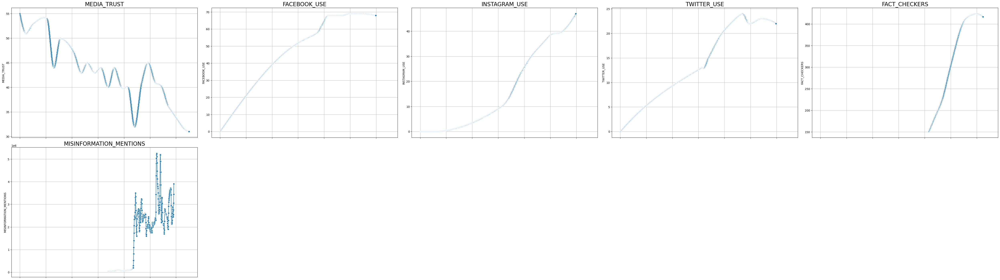

In [19]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [20]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT2_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT2_Interpolated.xlsx


### CLIENT 3: HEALTH

In [21]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT3_HEALTH', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE  \
0  Week-1-Jan-2000            10.3                  6.1              86.9   
1  Week-2-Jan-2000             NaN                  NaN               NaN   
2  Week-3-Jan-2000             NaN                  NaN               NaN   
3  Week-4-Jan-2000             NaN                  NaN               NaN   
4  Week-1-Feb-2000             NaN                  NaN               NaN   

   SUICIDE  OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0     10.4           NaN        NaN                  NaN         8407.0   
1      NaN           NaN        NaN                  NaN            NaN   
2      NaN           NaN        NaN                  NaN            NaN   
3      NaN           NaN        NaN                  NaN            NaN   
4      NaN           NaN        NaN                  NaN            NaN   

   OPIOID_PRESCRIP  ...  ALCOHOL_TREATMENT  OPIOID_TREATMENT  IVF_BABIES  \
0         

In [22]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE  SUICIDE  \
0 2000-01-01            10.3                  6.1              86.9     10.4   
1 2000-01-02             NaN                  NaN               NaN      NaN   
2 2000-01-03             NaN                  NaN               NaN      NaN   
3 2000-01-04             NaN                  NaN               NaN      NaN   
4 2000-02-01             NaN                  NaN               NaN      NaN   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN         8407.0   
1           NaN        NaN                  NaN            NaN   
2           NaN        NaN                  NaN            NaN   
3           NaN        NaN                  NaN            NaN   
4           NaN        NaN                  NaN            NaN   

   OPIOID_PRESCRIP  ...  ALCOHOL_TREATMENT  OPIOID_TREATMENT  IVF_BABIES  \
0              NaN  ...                NaN    

In [23]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE    SUICIDE  \
0       10.300000             6.100000         86.900000  10.400000   
1       10.296179             6.097229         86.892308  10.406703   
2       10.292408             6.094683         86.884615  10.413352   
3       10.288690             6.092359         86.876923  10.419947   
4       10.285025             6.090256         86.869231  10.426491   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN    8407.000000   
1           NaN        NaN                  NaN    8415.358725   
2           NaN        NaN                  NaN    8424.222883   
3           NaN        NaN                  NaN    8433.591756   
4           NaN        NaN                  NaN    8443.464627   

   OPIOID_PRESCRIP  FENTANYL_DEATHS  ALCOHOL_TREATMENT  OPIOID_TREATMENT  \
0              NaN       782.000000                NaN               NaN   
1              NaN      

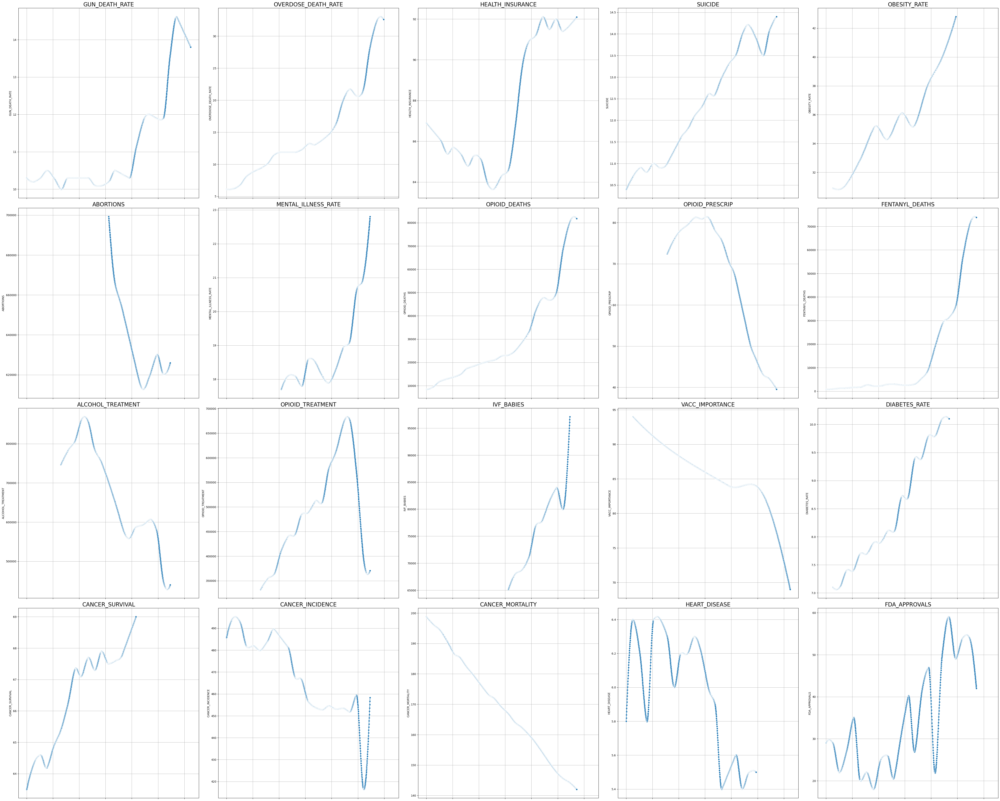

In [24]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [25]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT3_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT3_Interpolated.xlsx


### CLIENT 4: ELECTIONS

In [26]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT4_ELECTIONS', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  \
0  Week-1-Jan-2000       11.21           53.0                     NaN   
1  Week-2-Jan-2000         NaN            NaN                     NaN   
2  Week-3-Jan-2000         NaN            NaN                     NaN   
3  Week-4-Jan-2000         NaN            NaN                     NaN   
4  Week-1-Feb-2000         NaN            NaN                     NaN   

   CLOTURE_MOTIONS  ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0              NaN            NaN               NaN                 NaN   
1              NaN            NaN               NaN                 NaN   
2              NaN            NaN               NaN                 NaN   
3              NaN            NaN               NaN                 NaN   
4              NaN            NaN               NaN                 NaN   

   PARTISAN_GAP_SENATE  HOUSE_LEANING  SENATE_LEANING  
0                  NaN            NaN             NaN 

In [27]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  \
0 2000-01-01       11.21           53.0                     NaN   
1 2000-01-02         NaN            NaN                     NaN   
2 2000-01-03         NaN            NaN                     NaN   
3 2000-01-04         NaN            NaN                     NaN   
4 2000-02-01         NaN            NaN                     NaN   

   CLOTURE_MOTIONS  ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0              NaN            NaN               NaN                 NaN   
1              NaN            NaN               NaN                 NaN   
2              NaN            NaN               NaN                 NaN   
3              NaN            NaN               NaN                 NaN   
4              NaN            NaN               NaN                 NaN   

   PARTISAN_GAP_SENATE  HOUSE_LEANING  SENATE_LEANING  
0                  NaN            NaN             NaN  
1                  NaN            

In [28]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0   11.210000      53.000000                     NaN              NaN   
1   11.098395      52.425536                     NaN              NaN   
2   10.987052      51.856147                     NaN              NaN   
3   10.875989      51.292064                     NaN              NaN   
4   10.765222      50.733521                     NaN              NaN   

   ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  PARTISAN_GAP_SENATE  \
0            NaN               NaN                 NaN                  NaN   
1            NaN               NaN                 NaN                  NaN   
2            NaN               NaN                 NaN                  NaN   
3            NaN               NaN                 NaN                  NaN   
4            NaN               NaN                 NaN                  NaN   

   HOUSE_LEANING  SENATE_LEANING  
0            NaN             NaN  
1            NaN

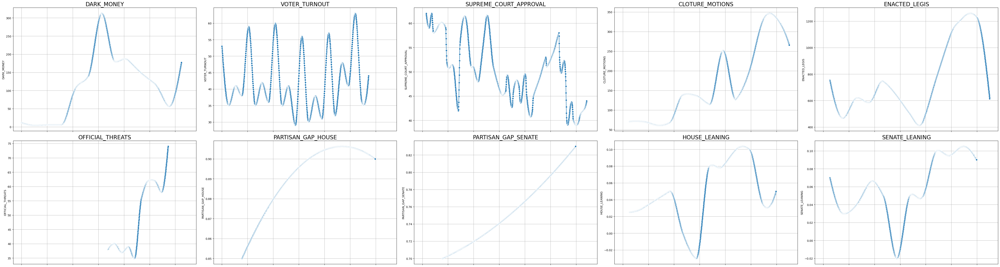

In [29]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [30]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT4_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT4_Interpolated.xlsx


### CLIENT 5: EDUCATION

In [31]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT5_EDUCATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  \
0  Week-1-Jan-2000          3349.0          14616.0      15312289.0   
1  Week-2-Jan-2000             NaN              NaN             NaN   
2  Week-3-Jan-2000             NaN              NaN             NaN   
3  Week-4-Jan-2000             NaN              NaN             NaN   
4  Week-1-Feb-2000             NaN              NaN             NaN   

   LOAN_DEBT  READING_PROF  MATH_PROF  
0        NaN          32.5       26.0  
1        NaN           NaN        NaN  
2        NaN           NaN        NaN  
3        NaN           NaN        NaN  
4        NaN           NaN        NaN  


In [32]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0 2000-01-01          3349.0          14616.0      15312289.0        NaN   
1 2000-01-02             NaN              NaN             NaN        NaN   
2 2000-01-03             NaN              NaN             NaN        NaN   
3 2000-01-04             NaN              NaN             NaN        NaN   
4 2000-02-01             NaN              NaN             NaN        NaN   

   READING_PROF  MATH_PROF  
0          32.5       26.0  
1           NaN        NaN  
2           NaN        NaN  
3           NaN        NaN  
4           NaN        NaN  


In [33]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  READING_PROF  \
0     3349.000000     14616.000000    1.531229e+07        NaN     32.500000   
1     3351.149310     14633.487606    1.532350e+07        NaN     32.516760   
2     3353.328048     14650.931280    1.533475e+07        NaN     32.533386   
3     3355.536267     14668.331153    1.534604e+07        NaN     32.549874   
4     3357.774023     14685.687356    1.535737e+07        NaN     32.566221   

   MATH_PROF  
0  26.000000  
1  26.024008  
2  26.047954  
3  26.071838  
4  26.095661  


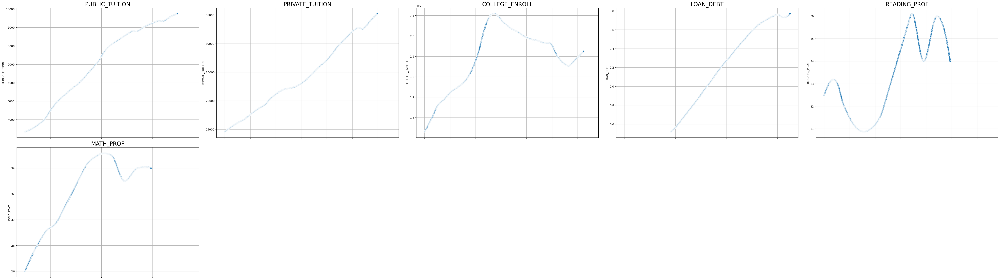

In [34]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [35]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT5_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT5_Interpolated.xlsx


### CLIENT 6: ENVIRONMENT

In [36]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT6_ENVIRONMENT', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  \
0  Week-1-Jan-2000     12.45        19.34         4.2           37.73   
1  Week-2-Jan-2000       NaN          NaN         NaN             NaN   
2  Week-3-Jan-2000       NaN          NaN         NaN             NaN   
3  Week-4-Jan-2000       NaN          NaN         NaN             NaN   
4  Week-1-Feb-2000       NaN          NaN         NaN             NaN   

   NATGAS_CONSUMP  RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  \
0           22.91            4.2       7.37           9350.0   
1             NaN            NaN        NaN              NaN   
2             NaN            NaN        NaN              NaN   
3             NaN            NaN        NaN              NaN   
4             NaN            NaN        NaN              NaN   

   ELECTRIC_VEHICLES  FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0                0.0         0.8607                5.0          1.86  
1                NaN            Na

In [37]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  \
0 2000-01-01     12.45        19.34         4.2           37.73   
1 2000-01-02       NaN          NaN         NaN             NaN   
2 2000-01-03       NaN          NaN         NaN             NaN   
3 2000-01-04       NaN          NaN         NaN             NaN   
4 2000-02-01       NaN          NaN         NaN             NaN   

   NATGAS_CONSUMP  RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  \
0           22.91            4.2       7.37           9350.0   
1             NaN            NaN        NaN              NaN   
2             NaN            NaN        NaN              NaN   
3             NaN            NaN        NaN              NaN   
4             NaN            NaN        NaN              NaN   

   ELECTRIC_VEHICLES  FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0                0.0         0.8607                5.0          1.86  
1                NaN            NaN                NaN           NaN  

In [38]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

    OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0  12.450000    19.340000    4.200000       37.730000       22.910000   
1  12.448176    19.344388    4.202293       37.742754       22.946000   
2  12.446358    19.348895    4.204366       37.755435       22.981306   
3  12.444545    19.353519    4.206221       37.768037       23.015916   
4  12.442738    19.358256    4.207862       37.780552       23.049828   

   RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0       4.200000   7.370000      9350.000000                0.0   
1       4.202674   7.366161      9514.643257                0.0   
2       4.205121   7.362338      9680.962127                0.0   
3       4.207343   7.358533      9848.963339                0.0   
4       4.209345   7.354749     10018.653620                0.0   

   FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0       0.860700           5.000000      1.860000  
1       0.874704           4.913997      1.838543  
2 

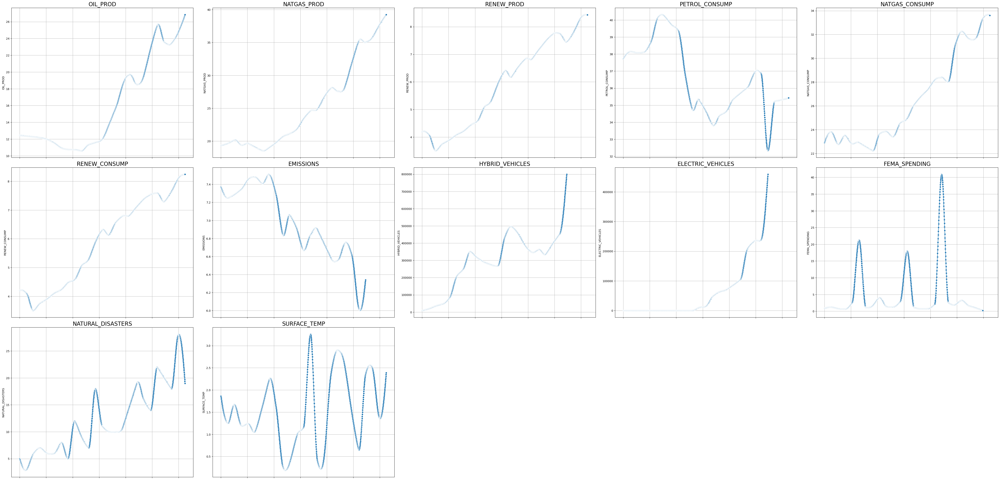

In [39]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [40]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT6_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT6_Interpolated.xlsx


### CLIENT 7: IMMIGRATION

In [41]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT7_IMMIGRATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  \
0  Week-1-Jan-2000                NaN     31107889.0         8460000.0   
1  Week-2-Jan-2000                NaN            NaN               NaN   
2  Week-3-Jan-2000                NaN            NaN               NaN   
3  Week-4-Jan-2000                NaN            NaN               NaN   
4  Week-1-Feb-2000                NaN            NaN               NaN   

   BORDER_SPENDING  DEPORTATIONS  ASYLUM_APPS  
0              6.9           NaN          NaN  
1              NaN           NaN          NaN  
2              NaN           NaN          NaN  
3              NaN           NaN          NaN  
4              NaN           NaN          NaN  


In [42]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  \
0 2000-01-01                NaN     31107889.0         8460000.0   
1 2000-01-02                NaN            NaN               NaN   
2 2000-01-03                NaN            NaN               NaN   
3 2000-01-04                NaN            NaN               NaN   
4 2000-02-01                NaN            NaN               NaN   

   BORDER_SPENDING  DEPORTATIONS  ASYLUM_APPS  
0              6.9           NaN          NaN  
1              NaN           NaN          NaN  
2              NaN           NaN          NaN  
3              NaN           NaN          NaN  
4              NaN           NaN          NaN  


In [43]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both').clip(lower=0)

# Display the first few rows after interpolation
print(df_interpolated.head())

   BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                NaN   3.110789e+07      8.460000e+06         6.900000   
1                NaN   3.111650e+07      8.463841e+06         6.869708   
2                NaN   3.112519e+07      8.467710e+06         6.840563   
3                NaN   3.113397e+07      8.471607e+06         6.812561   
4                NaN   3.114282e+07      8.475532e+06         6.785700   

   DEPORTATIONS  ASYLUM_APPS  
0           NaN          NaN  
1           NaN          NaN  
2           NaN          NaN  
3           NaN          NaN  
4           NaN          NaN  


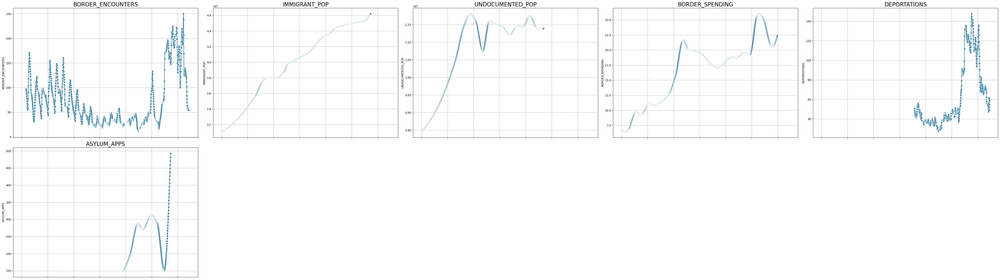

In [44]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [45]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT7_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT7_Interpolated.xlsx


### CLIENT 8: POPULATION

In [46]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT8_POPULATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  \
0  Week-1-Jan-2000             NaN           NaN            65.9   
1  Week-2-Jan-2000             NaN           NaN             NaN   
2  Week-3-Jan-2000             NaN           NaN             NaN   
3  Week-4-Jan-2000             NaN           NaN             NaN   
4  Week-1-Feb-2000             NaN           NaN             NaN   

   USA_POPULATION  WHITE_POP  HISPANIC_POP  BLACK_POP  AAPI_POP  \
0     282171936.0       69.4          12.6       12.2       3.8   
1             NaN        NaN           NaN        NaN       NaN   
2             NaN        NaN           NaN        NaN       NaN   
3             NaN        NaN           NaN        NaN       NaN   
4             NaN        NaN           NaN        NaN       NaN   

   CHRISTIAN_POP  NON_RELIGIOUS_POP  
0           86.0                8.0  
1            NaN                NaN  
2            NaN                NaN  
3            NaN                NaN 

In [47]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  \
0 2000-01-01             NaN           NaN            65.9     282171936.0   
1 2000-01-02             NaN           NaN             NaN             NaN   
2 2000-01-03             NaN           NaN             NaN             NaN   
3 2000-01-04             NaN           NaN             NaN             NaN   
4 2000-02-01             NaN           NaN             NaN             NaN   

   WHITE_POP  HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  \
0       69.4          12.6       12.2       3.8           86.0   
1        NaN           NaN        NaN       NaN            NaN   
2        NaN           NaN        NaN       NaN            NaN   
3        NaN           NaN        NaN       NaN            NaN   
4        NaN           NaN        NaN       NaN            NaN   

   NON_RELIGIOUS_POP  
0                8.0  
1                NaN  
2                NaN  
3                NaN  
4                Na

In [48]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0             NaN           NaN       65.900000    2.821719e+08  69.400000   
1             NaN           NaN       65.878047    2.822270e+08  69.388462   
2             NaN           NaN       65.856418    2.822821e+08  69.376923   
3             NaN           NaN       65.835108    2.823371e+08  69.365385   
4             NaN           NaN       65.814113    2.823920e+08  69.353846   

   HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  NON_RELIGIOUS_POP  
0     12.600000       12.2  3.800000      86.000000           8.000000  
1     12.607692       12.2  3.804807      86.018982           7.981139  
2     12.615385       12.2  3.809613      86.037456           7.963018  
3     12.623077       12.2  3.814413      86.055409           7.945636  
4     12.630769       12.2  3.819208      86.072827           7.928994  


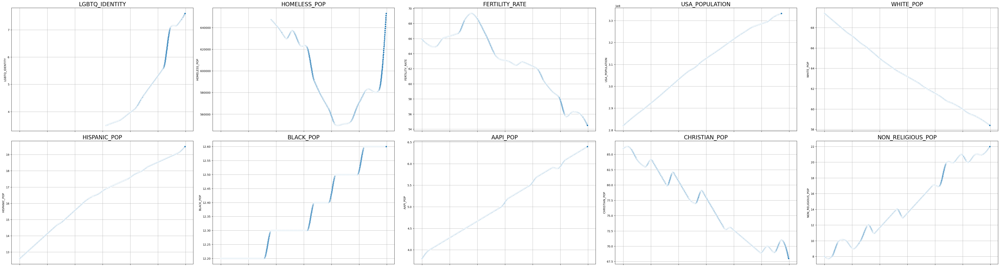

In [49]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [50]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT8_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT8_Interpolated.xlsx


### CLIENT 9: DEFENSE

In [51]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT9_DEFENSE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  \
0  Week-1-Jan-2000         30.3        365348.0                     NaN   
1  Week-2-Jan-2000          NaN             NaN                     NaN   
2  Week-3-Jan-2000          NaN             NaN                     NaN   
3  Week-4-Jan-2000          NaN             NaN                     NaN   
4  Week-1-Feb-2000          NaN             NaN                     NaN   

   MIL_DEATHS  
0       832.0  
1         NaN  
2         NaN  
3         NaN  
4         NaN  


In [52]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0 2000-01-01         30.3        365348.0                     NaN       832.0
1 2000-01-02          NaN             NaN                     NaN         NaN
2 2000-01-03          NaN             NaN                     NaN         NaN
3 2000-01-04          NaN             NaN                     NaN         NaN
4 2000-02-01          NaN             NaN                     NaN         NaN


In [53]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0    30.300000   365348.000000                     NaN  832.000000
1    30.175723   365370.123097                     NaN  833.866742
2    30.054791   365396.424258                     NaN  835.736151
3    29.937170   365426.801288                     NaN  837.608154
4    29.822824   365461.151992                     NaN  839.482678


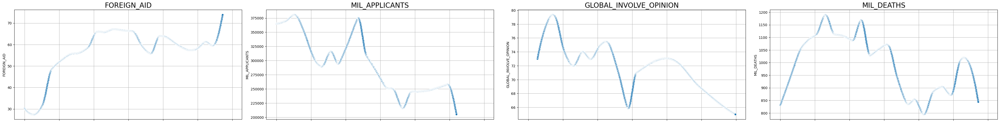

In [54]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [55]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT9_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT9_Interpolated.xlsx


### CLIENT 10: INFRASTRUCTURE

In [56]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT10_INFRASTRUCTURE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GOOD_BRIDGES  UNSATIS_ROADS
0  Week-1-Jan-2000           NaN          17.39
1  Week-2-Jan-2000           NaN            NaN
2  Week-3-Jan-2000           NaN            NaN
3  Week-4-Jan-2000           NaN            NaN
4  Week-1-Feb-2000           NaN            NaN


In [57]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GOOD_BRIDGES  UNSATIS_ROADS
0 2000-01-01           NaN          17.39
1 2000-01-02           NaN            NaN
2 2000-01-03           NaN            NaN
3 2000-01-04           NaN            NaN
4 2000-02-01           NaN            NaN


In [58]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   GOOD_BRIDGES  UNSATIS_ROADS
0           NaN      17.390000
1           NaN      17.383944
2           NaN      17.377701
3           NaN      17.371277
4           NaN      17.364674


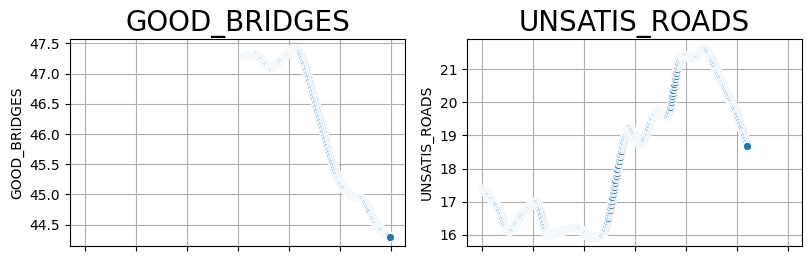

In [59]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [60]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT10_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT10_Interpolated.xlsx


### CLIENT 11: CRIME

In [61]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT11_CRIME', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  \
0  Week-1-Jan-2000              0.0          8543037.0     3793541.0   
1  Week-2-Jan-2000              NaN                NaN           NaN   
2  Week-3-Jan-2000              NaN                NaN           NaN   
3  Week-4-Jan-2000              NaN                NaN           NaN   
4  Week-1-Feb-2000              NaN                NaN           NaN   

   DOM_VIOLENCE_RATE  INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0                NaN             494.0            5.9                   NaN   
1                NaN               NaN            NaN                   NaN   
2                NaN               NaN            NaN                   NaN   
3                NaN               NaN            NaN                   NaN   
4                NaN               NaN            NaN                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN   

In [62]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  \
0 2000-01-01              0.0          8543037.0     3793541.0   
1 2000-01-02              NaN                NaN           NaN   
2 2000-01-03              NaN                NaN           NaN   
3 2000-01-04              NaN                NaN           NaN   
4 2000-02-01              NaN                NaN           NaN   

   DOM_VIOLENCE_RATE  INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0                NaN             494.0            5.9                   NaN   
1                NaN               NaN            NaN                   NaN   
2                NaN               NaN            NaN                   NaN   
3                NaN               NaN            NaN                   NaN   
4                NaN               NaN            NaN                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN              NaN  

In [63]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both').clip(lower=0)

# Display the first few rows after interpolation
print(df_interpolated.head())

   ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0         0.000000       8.543037e+06  3.793541e+06                NaN   
1         0.190743       8.557898e+06  3.764666e+06                NaN   
2         0.378364       8.572529e+06  3.736068e+06                NaN   
3         0.562871       8.586926e+06  3.707759e+06                NaN   
4         0.744277       8.601084e+06  3.679751e+06                NaN   

   INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0        494.000000       5.900000                   NaN   
1        493.895079       5.943974                   NaN   
2        493.791918       5.987421                   NaN   
3        493.690613       6.030325                   NaN   
4        493.591261       6.072667                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN              NaN   
1                    NaN                 NaN              NaN   

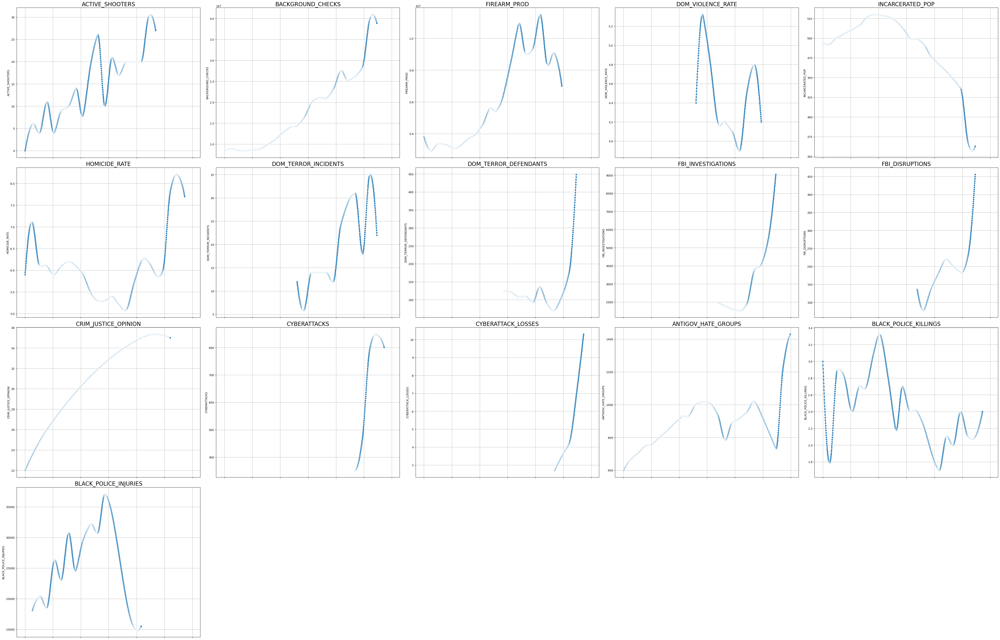

In [64]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [65]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT11_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT11_Interpolated.xlsx


### CLIENT 12: AGRICULTURE

In [66]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT12_AGRICULTURE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  AGRI_SPENDING      FARMS  AGRI_SALES
0  Week-1-Jan-2000           2.08  2163739.6       322.2
1  Week-2-Jan-2000            NaN        NaN         NaN
2  Week-3-Jan-2000            NaN        NaN         NaN
3  Week-4-Jan-2000            NaN        NaN         NaN
4  Week-1-Feb-2000            NaN        NaN         NaN


In [67]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  AGRI_SPENDING      FARMS  AGRI_SALES
0 2000-01-01           2.08  2163739.6       322.2
1 2000-01-02            NaN        NaN         NaN
2 2000-01-03            NaN        NaN         NaN
3 2000-01-04            NaN        NaN         NaN
4 2000-02-01            NaN        NaN         NaN


In [68]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   AGRI_SPENDING         FARMS  AGRI_SALES
0       2.080000  2.163740e+06  322.200000
1       2.065147  2.163096e+06  322.490353
2       2.050398  2.162458e+06  322.771126
3       2.035752  2.161826e+06  323.042470
4       2.021211  2.161201e+06  323.304534


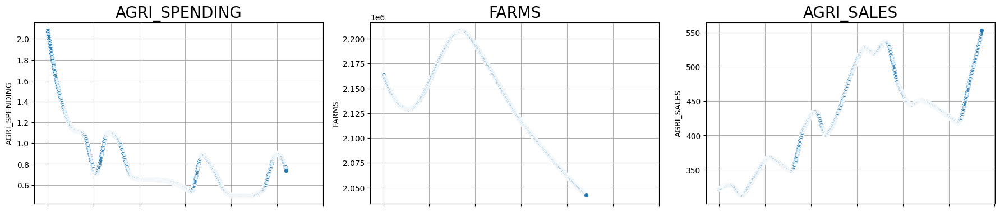

In [69]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [70]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT12_Interpolated.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT12_Interpolated.xlsx


### GLOBAL OUTPUT

In [71]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='GLOBAL', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GOVT_SATISFACTION
0  Week-1-Jan-2000               69.0
1  Week-2-Jan-2000                NaN
2  Week-3-Jan-2000                NaN
3  Week-4-Jan-2000                NaN
4  Week-1-Feb-2000                NaN


In [72]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GOVT_SATISFACTION
0 2000-01-01               69.0
1 2000-01-02                NaN
2 2000-01-03                NaN
3 2000-01-04                NaN
4 2000-02-01                NaN


In [73]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   GOVT_SATISFACTION
0          69.000000
1          68.615525
2          68.174198
3          67.672741
4          67.107872


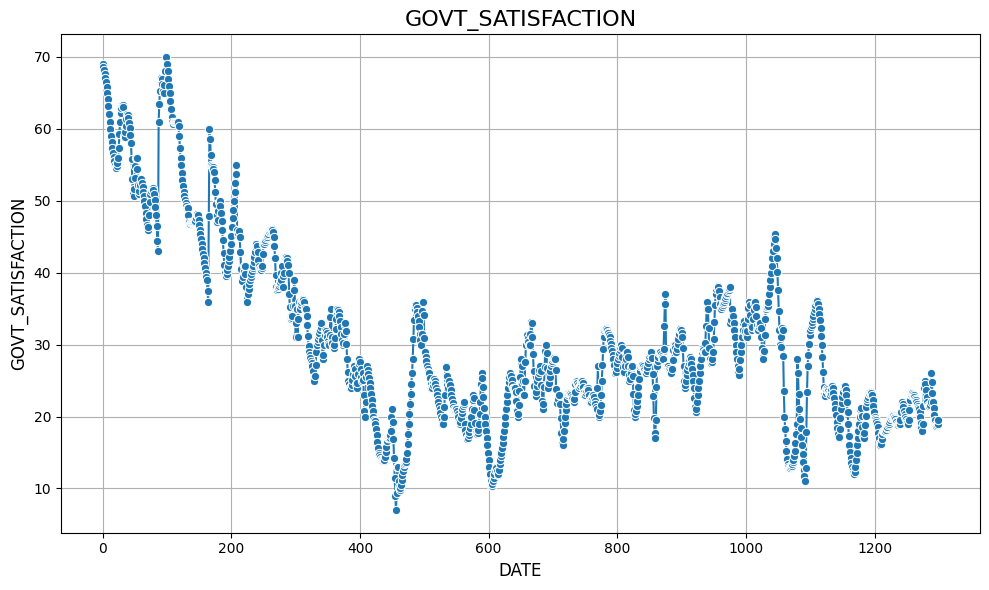

In [74]:
# Plot the global output 'GOVT_SATISFACTION' variable
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_interpolated, x=df_interpolated.index, y='GOVT_SATISFACTION', marker='o')

# Customize plot
plt.title('GOVT_SATISFACTION', fontsize=16)
plt.xlabel('DATE', fontsize=12)
plt.ylabel('GOVT_SATISFACTION', fontsize=12)
plt.grid(True)

plt.tight_layout()
plt.show()

In [75]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_GLOBAL.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_GLOBAL.xlsx


### LLM
Initial data analysis on word length

In [76]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='LLM', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE                                        NEWS_EVENTS
0  Week-1-Jan-2000  Alan Greenspan is nominated for a fourth term ...
1  Week-2-Jan-2000  America Online announces an agreement to purch...
2  Week-3-Jan-2000  A dorm fire at Seton Hall University kills thr...
3  Week-4-Jan-2000  The rap-metal band Rage Against the Machine pl...
4  Week-1-Feb-2000                                                NaN


In [77]:
llm_counts = df['NEWS_EVENTS'].apply(lambda x: len(str(x).split()))
print(llm_counts.describe())

count    1300.000000
mean      103.886923
std       103.396203
min         1.000000
25%        27.750000
50%        70.500000
75%       150.000000
max       602.000000
Name: NEWS_EVENTS, dtype: float64


In [78]:
# Compute 90th, 95th, 97th, and 99th percentiles of word counts
percentile_90 = llm_counts.quantile(0.9)
print(f"90th Percentile of Word Length: {percentile_90}")
percentile_95 = llm_counts.quantile(0.95)
print(f"95th Percentile of Word Length: {percentile_95}")
percentile_97 = llm_counts.quantile(0.97)
print(f"97th Percentile of Word Length: {percentile_97}")
percentile_99 = llm_counts.quantile(0.99)
print(f"99th Percentile of Word Length: {percentile_99}")

90th Percentile of Word Length: 247.0
95th Percentile of Word Length: 318.0999999999999
97th Percentile of Word Length: 358.14999999999986
99th Percentile of Word Length: 455.03


Finally export DATE column as datetime

In [79]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE                                        NEWS_EVENTS
0 2000-01-01  Alan Greenspan is nominated for a fourth term ...
1 2000-01-02  America Online announces an agreement to purch...
2 2000-01-03  A dorm fire at Seton Hall University kills thr...
3 2000-01-04  The rap-metal band Rage Against the Machine pl...
4 2000-02-01                                                NaN


In [80]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_LLM_DATE.xlsx"

# Save DataFrame to Excel
df.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_LLM_DATE.xlsx


In [81]:
# End of code 2/24/25
# Edited 2/27/25